# Lab 11: Visualization

Replicate the following visuals, using the planes and flights datasets as appropriate.

First, we'll need to load our data.

In [1]:
import pandas as pd

planes = pd.read_csv('../data/planes.csv')
flights = pd.read_csv('../data/flights.csv')

In [3]:
import matplotlib.pyplot as plt

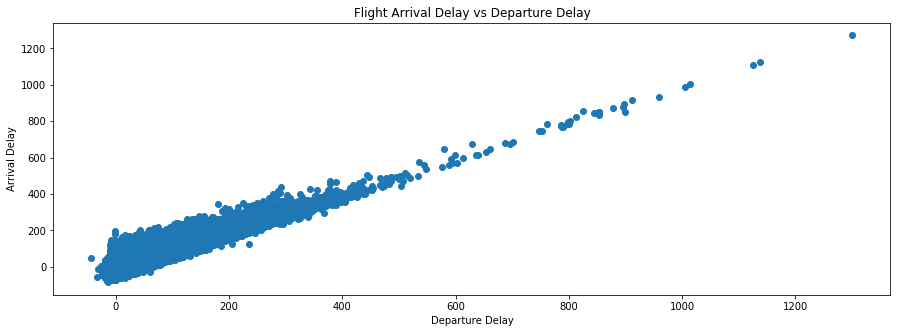

In [5]:
# Set up a figure -- I chose a 15x5 one.
plt.figure(figsize=(15, 5))

# Since it's just one axes, the simple `plt.` interface will be fine.
plt.scatter('dep_delay', 'arr_delay', data=flights);
plt.xlabel('Departure Delay')
plt.ylabel('Arrival Delay')
plt.title('Flight Arrival Delay vs Departure Delay');

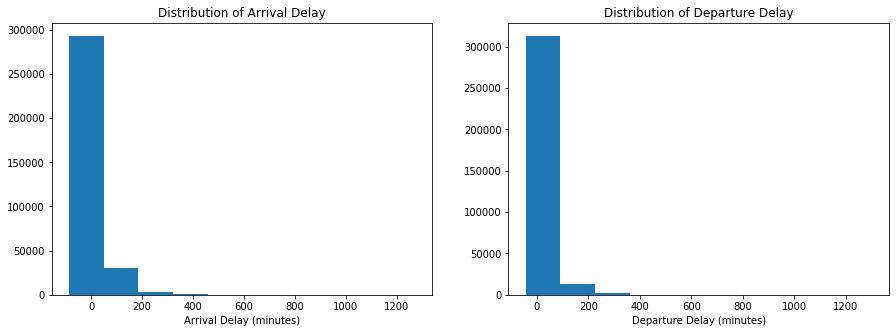

In [9]:
# To create multiple axes, we need the plt.subplots approach.
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Left plot.
ax[0].hist('arr_delay', data=flights)
ax[0].set_title('Distribution of Arrival Delay')
ax[0].set_xlabel('Arrival Delay (minutes)')

# Right plot.
ax[1].hist('dep_delay', data=flights)
ax[1].set_title('Distribution of Departure Delay')
ax[1].set_xlabel('Departure Delay (minutes)');

In [10]:
# As we saw in class, density plots are easily done in seaborn.
import seaborn as sns

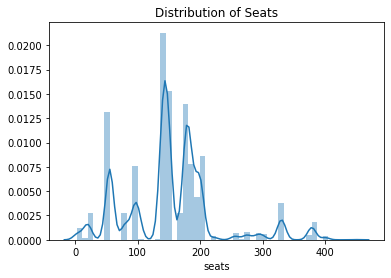

In [11]:
sns.distplot(planes['seats'])
# Notably, seaborn automatically labels the x-axis for us.
plt.title('Distribution of Seats');

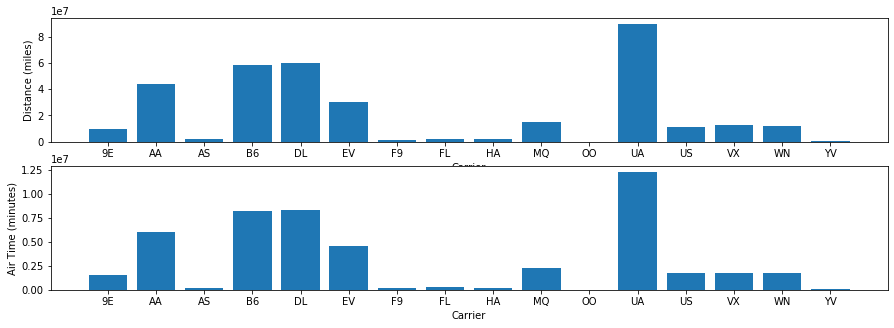

In [12]:
# Again, multiple plots, but this time 2 rows and 1 column.
fig, ax = plt.subplots(2, 1, figsize=(15, 5))

# In matplotlib, we need to do aggregations ourselves.
sum_by_carrier = flights.groupby('carrier', as_index=False).sum()

ax[0].bar('carrier', 'distance', data=sum_by_carrier)
ax[0].set_xlabel('Carrier')
ax[0].set_ylabel('Distance (miles)')

ax[1].bar('carrier', 'air_time', data=sum_by_carrier)
ax[1].set_xlabel('Carrier')
ax[1].set_ylabel('Air Time (minutes)');

I noticed, in creating the solutions to this lab, that my upper x-label was cut off.
Spacing between charts can be adjusted to fix issues like this:

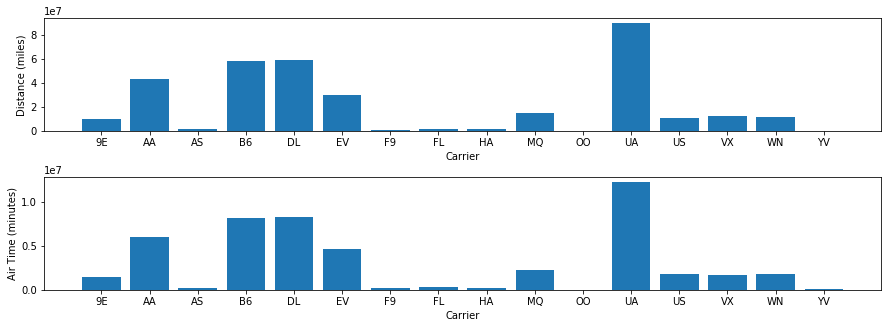

In [18]:
fig, ax = plt.subplots(2, 1, figsize=(15, 5))
# This line adds "height spacing" (wspace is also available, for width spacing)
fig.subplots_adjust(hspace=0.4)

sum_by_carrier = flights.groupby('carrier', as_index=False).sum()

ax[0].bar('carrier', 'distance', data=sum_by_carrier)
ax[0].set_xlabel('Carrier')
ax[0].set_ylabel('Distance (miles)')

ax[1].bar('carrier', 'air_time', data=sum_by_carrier)
ax[1].set_xlabel('Carrier')
ax[1].set_ylabel('Air Time (minutes)');

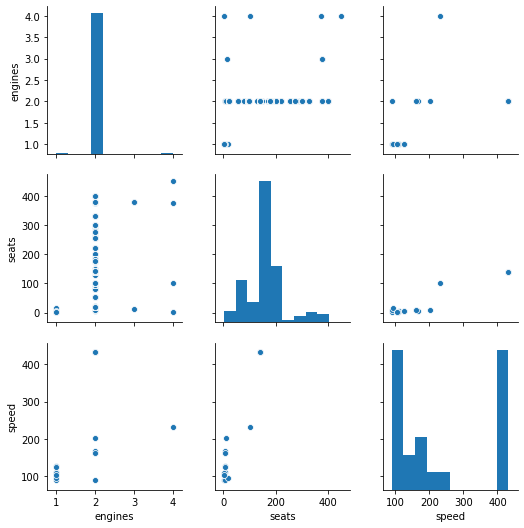

In [20]:
sns.pairplot(planes[['engines', 'seats', 'speed']]);

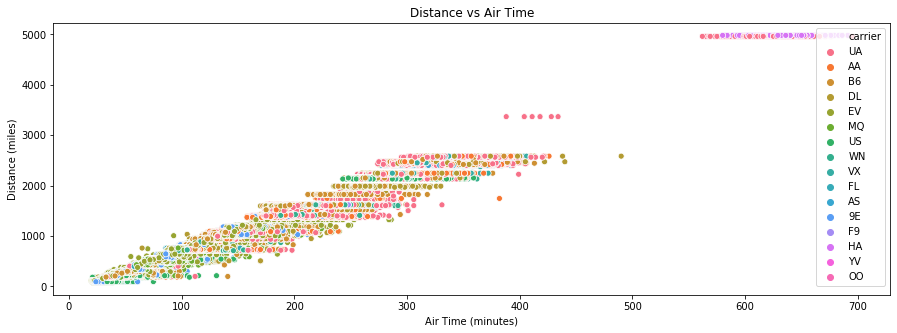

In [26]:
plt.figure(figsize=(15, 5))

# You could do this one it matplotlib but it's much much easier in Seaborn,
# which makes it easy to add a color dimension.
sns.scatterplot('air_time', 'distance', hue='carrier', data=flights)
# Still easy to use the matplotlib interface to set labels/title.
plt.title('Distance vs Air Time')
plt.xlabel('Air Time (minutes)')
plt.ylabel('Distance (miles)');

### Stretch Goal

If you're feeling ambitious, try recreating one or two of the above in Altair.

In [27]:
import altair as alt

Because, Altair limits you to 5000 rows by default, I'm going to sample down the flights data.
The planes data is already small enough.

In [35]:
flights = flights.sample(n=5000)

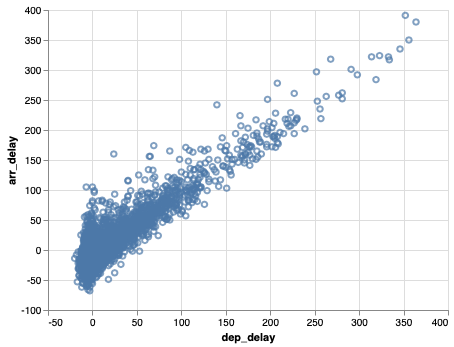

In [38]:
# Make the chart.
chart_1 = alt.Chart(flights).mark_point().encode(
    x='dep_delay',
    y='arr_delay'
)
# Show the chart.
chart_1

The simple syntax above is often fine for quick work, but if you want to update labels and titles it's not too hard:

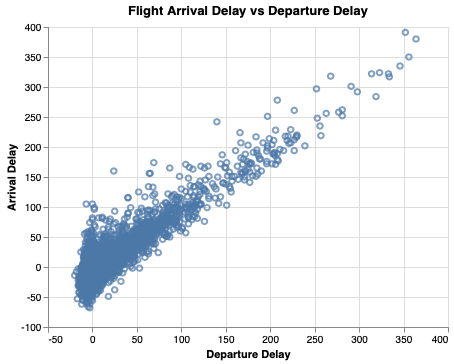

In [45]:
# Make the chart.
chart_1 = alt.Chart(flights).mark_point().encode(
    x=alt.X('dep_delay', title='Departure Delay'),
    y=alt.Y('arr_delay', title='Arrival Delay')
).properties(
    title='Flight Arrival Delay vs Departure Delay'
)
# Show the chart.
chart_1

To make your chart interactive, allowing zooming and scrolling, just add `.interactive()` to the end of it.

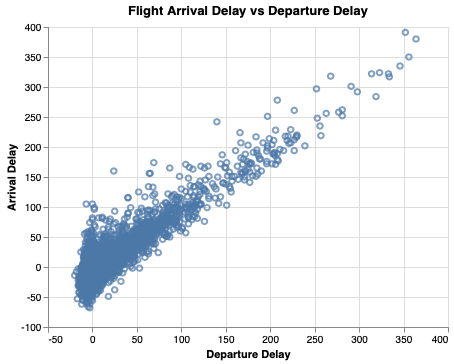

In [46]:
# Make the chart.
chart_1 = alt.Chart(flights).mark_point().encode(
    x=alt.X('dep_delay', title='Departure Delay'),
    y=alt.Y('arr_delay', title='Arrival Delay')
).properties(
    title='Flight Arrival Delay vs Departure Delay'
)
# Show the chart.
chart_1.interactive()

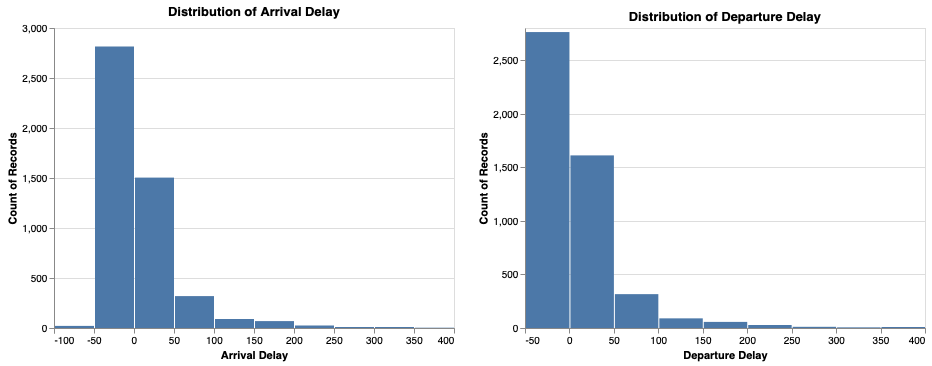

In [52]:
# We'll build the two plot separately at first, then combine them.

# Histograms use an unusual syntax in altair.
arr_delay_chart = alt.Chart(flights).mark_bar().encode(
    alt.X("arr_delay", bin=True, title='Arrival Delay'),
    y='count()',
).properties(
    title='Distribution of Arrival Delay'
)

dep_delay_chart = alt.Chart(flights).mark_bar().encode(
    alt.X("dep_delay", bin=True, title='Departure Delay'),
    y='count()',
).properties(
    title='Distribution of Departure Delay'
)

# Use a "|" (called the pipe operator) to combine plots side-by-side
arr_delay_chart | dep_delay_chart

In [57]:
# Skipping our third visual as density plots in altair don't come out-of-the-box, unfortunately.
# In the newest version of altair, it is possible to make them, though.
# See https://altair-viz.github.io/gallery/density_stack.html

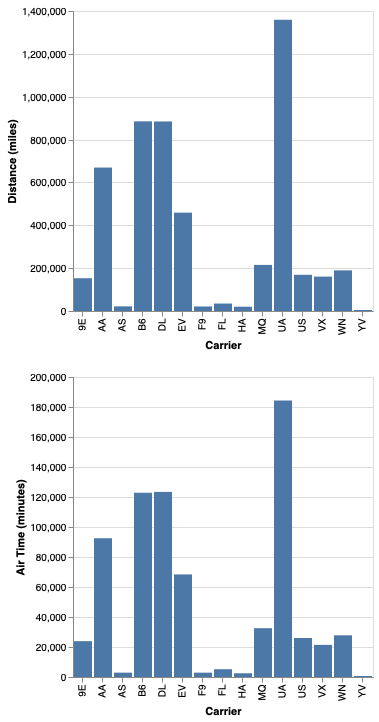

In [76]:
# As before, we need to aggregate our data first.
sum_by_carrier = flights.groupby('carrier', as_index=False).sum()

dist_by_carrier = alt.Chart(sum_by_carrier).mark_bar().encode(
    x=alt.X('carrier', title='Carrier'),
    y=alt.Y('distance', title='Distance (miles)')
)
time_by_carrier = alt.Chart(sum_by_carrier).mark_bar().encode(
    x=alt.X('carrier', title='Carrier'),
    y=alt.Y('air_time', title='Air Time (minutes)')
)

# Combine charts vertically with the & operator:
dist_by_carrier & time_by_carrier

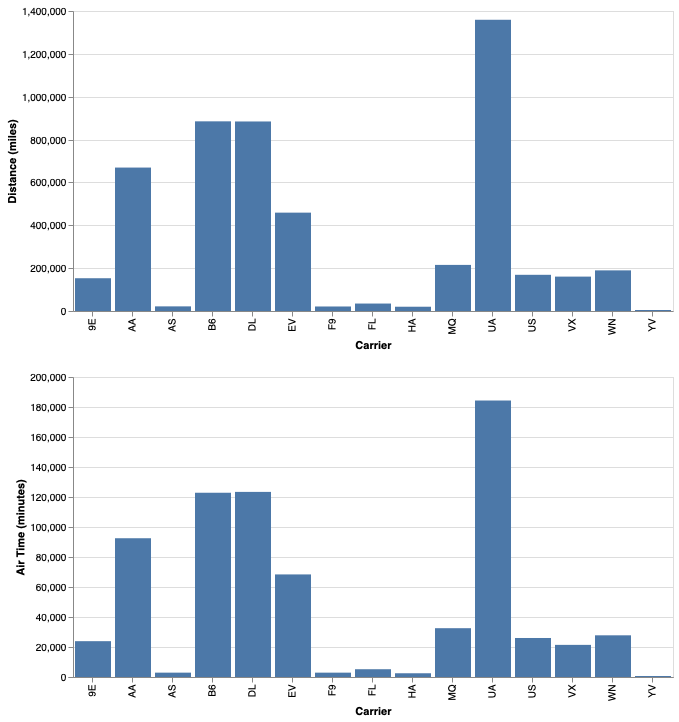

In [77]:
# Want to adjust chart dimensions? Just do it on each chart before combining.
(dist_by_carrier.properties(width=600)
 & time_by_carrier.properties(width=600))

In [78]:
# Skipping the fifth graphic, as pairplots are a feature of Seaborn and not natively included in altair.
# However, here is a discussion of how you might go about making one in altair from scratch:
# https://stackoverflow.com/questions/50919267/pairwise-scatterplot-matrix

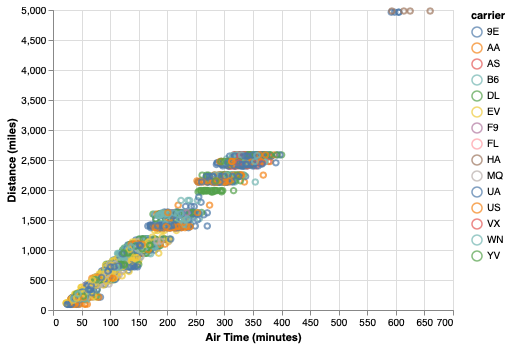

In [79]:
alt.Chart(flights).mark_point().encode(
    x=alt.X('air_time', title='Air Time (minutes)'),
    y=alt.Y('distance', title='Distance (miles)'),
    color='carrier'
).properties(
    title='Distance vs Air Time')